In [1]:
import pandas as pd
import requests
import time
from tqdm import tqdm
import os

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', 500)

In [8]:
all_path = "/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_21_oct_es"
gencat_path = "/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_31_oct_tr"
zaragoza_path = "/export/data_ml4ds/NextProcurement/temporal/objectives_extracted"
zaragoza_path_v2 = "/export/data_ml4ds/NextProcurement/temporal/objectives_extracted_v2"
zaragoza_path_original = "/export/data_ml4ds/NextProcurement/temporal/objectives_extracted_original"
new_extracted= "/export/data_ml4ds/NextProcurement/PLACE/to_process_place_all_feb_22_objectives_extracted"

In [9]:
def load_parquet_into_one(input_folder):
    dfs = []
    for file_name in tqdm(os.listdir(input_folder)):
        if file_name.endswith(".parquet"):
            file_path = os.path.join(input_folder, file_name)
            df = pd.read_parquet(file_path)
            dfs.append(df)    
    return pd.concat(dfs, ignore_index=True) 

In [10]:
df = load_parquet_into_one(all_path)
df_gencat = load_parquet_into_one(gencat_path)
df_df_gencat = pd.concat([df, df_gencat])

100%|██████████| 17/17 [00:45<00:00,  2.68s/it]


In [ ]:
df_zaragoza = load_parquet_into_one(zaragoza_path)
df_zaragoza2 = load_parquet_into_one(zaragoza_path_v2)
df_zaragoza_original = load_parquet_into_one(zaragoza_path_original)

100%|██████████| 7/7 [00:01<00:00,  5.73it/s]


In [ ]:
#df_new_place = load_parquet_into_one(new_extracted)
#df_new_place[["procurement_id", 'objective']]

## Detect language

In [11]:
from transformers import pipeline

"""
lang_detector = pipeline("text-classification", model="papluca/xlm-roberta-base-language-detection")

def langDetect(row):
    try:
        prediction = lang_detector(row.objective.replace("\n", ""), truncation=True)
        lang = prediction[0]['label']
    except Exception:
        lang = "unknown"
    return lang
"""

import langid

def langDetect(row):
    try:
        lang, _ = langid.classify(row.objective.replace("\n", ""))
    except Exception:
        lang = "unknown"
    return lang

/export/usuarios_ml4ds/lbartolome/NextProcurement/NP-Text_Object/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
df_df_gencat["lang_objective"] = df_df_gencat.apply(langDetect, axis=1)

In [ ]:
#df_df_gencat["lang_objective"] = df_df_gencat.apply(langDetect, axis=1)
df_zaragoza["lang_objective"] = df_zaragoza.apply(langDetect, axis=1)
df_zaragoza2["lang_objective"] = df_zaragoza2.apply(langDetect, axis=1)
df_zaragoza_original["lang_objective"] = df_zaragoza_original.apply(langDetect, axis=1)

In [ ]:
#df_df_gencat = df_df_gencat[['procurement_id', 'doc_name', 'translated', 'lang', 'objective', 'in_text_score', 'alternative_lang', 'lang_objective']]

In [ ]:
df_not_found = df_zaragoza[(df_zaragoza.lang_objective == "en") | (df_zaragoza.objective == "/")]
print(df_not_found.shape)
df_not_found2 = df_zaragoza2[(df_zaragoza2.lang_objective == "en") | (df_zaragoza2.objective == "/")]
print(df_not_found2.shape)
df_not_found_original = df_zaragoza_original[(df_zaragoza_original.lang_objective == "en") | (df_zaragoza_original.objective == "/")]
print(df_not_found_original.shape)


(144, 11)
(127, 11)
(59, 21)


In [ ]:
df_zaragoza_original['expediente'] = df_zaragoza_original['pdf_path'].apply(lambda x: x.split("/")[-2])
df_zaragoza2['expediente'] = df_zaragoza2['pdf_path'].apply(lambda x: x.split("/")[-2])


def get_original_objective(expediente):
    url = f"https://www.zaragoza.es/sede/servicio/contratacion-publica/contrato.json?expediente={expediente}&fl=objeto"    
    try:
        response = requests.get(url, timeout=10)  
        response.raise_for_status()  
        
        data = response.json()
        #print(data)
        if "result" in data and 'objeto' in data["result"][0]:
            #object = data["result"][0]["objeto"]
            #print(f"Expediente {expediente} - Object: {object}")
            return data["result"][0]["objeto"]
        else:
            return None  

    except requests.exceptions.RequestException as e:
        print(f"Error fetching expediente {expediente}: {e}")
        return None

df_zaragoza_original['orig_objective'] = df_zaragoza_original['expediente'].apply(get_original_objective)
df_zaragoza2['orig_objective'] = df_zaragoza2['expediente'].apply(get_original_objective)

Error fetching expediente 0045893-23: HTTPSConnectionPool(host='www.zaragoza.es', port=443): Read timed out. (read timeout=10)


In [ ]:
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

model = SentenceTransformer("paraphrase-multilingual-MiniLM-L12-v2")

def compute_similarity(row, col1, col2):
    text1, text2 = row[col1], row[col2]
    
    if pd.notna(text1) and pd.notna(text2):  # Ensure both are not None
        emb1 = model.encode([text1])[0]
        emb2 = model.encode([text2])[0]
        similarity = cosine_similarity([emb1], [emb2])[0][0]
        return similarity
    return np.nan  # If any value is None, return NaN

def add_similarity_column(df, col1, col2, new_col="similarity"):
    df[new_col] = df.apply(lambda row: compute_similarity(row, col1, col2), axis=1)
    return df

/export/usuarios_ml4ds/lbartolome/NextProcurement/NP-Text_Object/.venv/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
df_zaragoza2 = add_similarity_column(df_zaragoza2, "objective", "orig_objective")
df_zaragoza_original = add_similarity_column(df_zaragoza_original, "objective", "orig_objective")

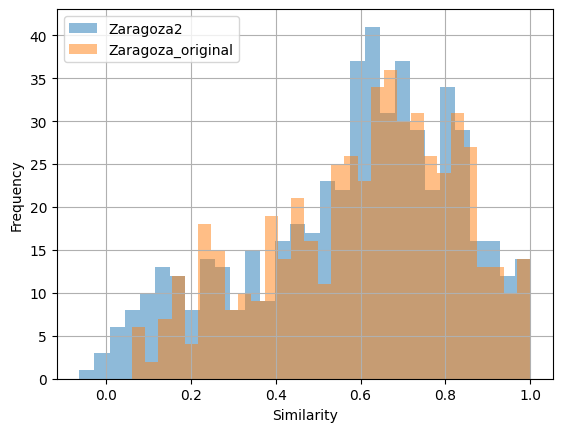

In [ ]:
import matplotlib.pyplot as plt

df_zaragoza2.similarity.hist(alpha=0.5, label="Zaragoza2", bins=30)
df_zaragoza_original.similarity.hist(alpha=0.5, label="Zaragoza_original", bins=30)

plt.legend()
plt.xlabel("Similarity")
plt.ylabel("Frequency")
plt.show()


In [ ]:
df_zaragoza_original[df_zaragoza_original.similarity < 0.2][["objective", "orig_objective", "similarity"]]

,objective,orig_objective,similarity
106,2 OBJETO,"Obras de reparación de mediana y laterales del Tercer Cinturón Z-30 de Zaragoza como consecuencia de lluvias intensas provocadas por el fenómeno meteorológico adverso denominado ""Zaragoza"" e identificado como (FMA): 06/07/2023, de acuerdo con el Proyecto aprobado por la Consejera de Medio Ambiente y Movilidad, en fecha 9 de mayo de 2024 y cuyo conjunto de documentos tiene carácter contractual.",0.186032
139,/,Adquisición y suministro de ocho motocicletas policiales con destino a la Policía Local de Zaragoza.,0.060846
141,2 OBJETO,"Obras de reparación de caminos, andadores y taludes como consecuencia de lluvias intensas provocadas por el fenómeno meteorológico adverso denominado ""Zaragoza"" e identificado como (FMA): 06/07/2023 de acuerdo con el proyecto aprobado por la Consejera de Medio Ambiente y Movilidad, en fecha 17 de junio de 2024 y cuyo conjunto de documentos tiene carácter contractual.",0.152010
145,"conformidad con el proyecto que la define, la licencia de edificación y demás autorizaciones preceptivas y las condiciones del contrato, con el objeto de asegurar su adecuación al fin propuesto",Ejecución de las obras de construcción del edificio de Servicios Sociales San José (Sánchez Punter).,0.183842
152,ANTECEDENTES Y OBJETO,Obras de reforma de instalación de climatización e instalación fotovoltaica para autoconsumo acogida a compensación en la Escuela Infantil Los Vientos.\r\n,0.168924
180,/,"Adquisición y suministro de 2 vehículos híbridos no enchufables y 1 vehículo todo terreno tipo pick-up doble cabina para el Servicio de Parques, Jardines e Infraestructuras Verdes del Ayuntamiento de Zaragoza.",0.075299
260,/,Dirección Facultativa de las obras de renovación de vasos de piscina en CDM Aguas Claras del Bº de Casetas,0.174041
277,El objeto del contrato es la prestación de servicios para la redacción del proyecto anteriormente indicado,Redacción del proyecto de urbanización de la Plaza Salamero de Zaragoza,0.110068
278,/,Servicio de renovación del soporte de las cabinas NAS FAS8040,0.087966
328,desarrollar una potente,Desarrollo del sistema de predicción de la calidad del aire PRECOZ 2.0,0.113049


In [ ]:
def get_final_objective(row, thr=0.2):
    if row.objective == "/" or row.lang_objective == "en" or (row.similarity < thr and row.orig_objective):
        return row.orig_objective or ""
    return row.objective if row.similarity >= thr or len(row.objective) > 21 else ""

In [ ]:
df_zaragoza_original["final_objective"] = df_zaragoza_original.apply(get_final_objective, axis=1)

def get_origin(row):
    if row.objective == row.final_objective:
        return "extracted"
    elif row.orig_objective == row.final_objective:
        return "metadata"
    else:
        return "nan"

df_zaragoza_original["origin"] = df_zaragoza_original.apply(get_origin, axis=1)
df_zaragoza_original["origin"].value_counts()

origin
extracted    550
metadata      64
nan           11
Name: count, dtype: int64

In [ ]:
columns_keep = ['expediente', 'pdf_path', 'objective', 'lang_objective', 'orig_objective', 'similarity', 'in_text_score', 'final_objective', 'origin']
df_zaragoza_original = df_zaragoza_original[columns_keep]

## Get PLACE metadata

In [ ]:
# insiders / minors
columns_keep_ins_min = [
    #'ContractFolderStatus.ContractFolderID', # Expediente
    'ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode', # CPV
    'ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode', # Country NUTS
    'ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name', # Ubicación orgánica
    'ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount', # Presupuesto
    'ContractFolderStatus.TenderResult.SMEAwardedIndicator', # Es pyme
    'ContractFolderStatus.ContractFolderID', #Expediente
    'title', # PLACE title (objective)
    'ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate', # Date
    'origin',
    'place_id'
]
# outsiders
columns_keep_out = [
    #'ContractFolderStatus.ContractFolderID', # Expediente
    'ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode', #CPV
    'ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode', # Country NUTS
    'ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name', # Ubicación orgánica
    'ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount', # Presupuesto
    'ContractFolderStatus.ContractFolderID', #Expediente
    'title', # PLACE title (objective)
    'ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate', # Date
    'origin',
    'place_id'
]

In [ ]:
df_PLACE_ins = pd.read_parquet('/export/usuarios_ml4ds/cggamella/sproc/DESCARGA_PLACE_NOV/insiders.parquet')
df_PLACE_out = pd.read_parquet('/export/usuarios_ml4ds/cggamella/sproc/DESCARGA_PLACE_NOV/outsiders.parquet')
df_PLACE_min = pd.read_parquet('/export/usuarios_ml4ds/cggamella/sproc/DESCARGA_PLACE_NOV/minors.parquet')

df_PLACE_out['origin'] = 'out'
df_PLACE_ins['origin'] = 'ins'
df_PLACE_min['origin'] = 'min'

def unify_colname(col):
    return ".".join([el for el in col if el])

df_PLACE_ins = df_PLACE_ins.rename(columns={"id":"place_id"})
df_PLACE_min = df_PLACE_min.rename(columns={"id":"place_id"})
df_PLACE_out = df_PLACE_out.rename(columns={"id":"place_id"})

df_PLACE_out.columns = [unify_colname(col) for col in df_PLACE_out.columns]
df_PLACE_ins.columns = [unify_colname(col) for col in df_PLACE_ins.columns]
df_PLACE_min.columns = [unify_colname(col) for col in df_PLACE_min.columns]

In [ ]:
df_PLACE_out = df_PLACE_out[columns_keep_out]
df_PLACE_out["origin"] = ["out"] * df_PLACE_out.shape[0]
df_PLACE_out = df_PLACE_out.loc[:, ~df_PLACE_out.columns.duplicated()]

df_PLACE_ins = df_PLACE_ins[columns_keep_ins_min]
df_PLACE_ins["origin"] = ["ins"] * df_PLACE_ins.shape[0]
df_PLACE_ins = df_PLACE_ins.loc[:, ~df_PLACE_ins.columns.duplicated()]

df_PLACE_min = df_PLACE_min[columns_keep_ins_min]
df_PLACE_min["origin"] = ["min"] * df_PLACE_min.shape[0]
df_PLACE_min = df_PLACE_min.loc[:, ~df_PLACE_min.columns.duplicated()]

In [ ]:
df_PLACE_all = pd.concat([df_PLACE_min, df_PLACE_ins, df_PLACE_out], ignore_index=True)
len(df_PLACE_all)

In [ ]:
df_PLACE_all.head(5)

In [ ]:
df_zaragoza_final = pd.merge(df_zaragoza_original, df_PLACE_all, left_on="expediente", right_on="ContractFolderStatus.ContractFolderID", how="left")

In [ ]:
columns_order =  df_zaragoza_final.columns.tolist()
df_zaragoza_final["id_tm"] = range(1, len(df_zaragoza_final) + 1)
columns_order = ['id_tm'] + columns_order
df_zaragoza_final = df_zaragoza_final[columns_order]
df_zaragoza_final.to_parquet("/export/data_ml4ds/NextProcurement/temporal/zaragoza_objectives_extracted_final.parquet")

In [52]:
df_zaragoza_final = pd.read_parquet("/export/data_ml4ds/NextProcurement/temporal/zaragoza_objectives_extracted_final_with_lemmas.parquet")
df_zaragoza_final

,id_tm,expediente,pdf_path,objective,lang_objective,orig_objective,similarity,in_text_score,final_objective,origin_x,...,ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate,origin_y,place_id,raw_text_x,lemmas_x,raw_text_y,lemmas_y,raw_text,lemmas,embeddings
0,1,1721186-18,/home/sblanco/pliegos/data/2019/1721186-18/PPT...,El objeto del presente proyecto de Renovación ...,es,None,NaN,1.000000,El objeto del presente proyecto de Renovación ...,extracted,...,"[['2019-10-16', '2019-02-12', '2019-02-12', '2...",ins,https://contrataciondelestado.es/sindicacion/l...,El objeto del presente proyecto de Renovación ...,presente renovación alumbrado_público mejora e...,El objeto del presente proyecto de Renovación ...,presente renovación alumbrado_público mejora e...,El objeto del presente proyecto de Renovación ...,presente renovación alumbrado_público mejora e...,-0.046572376 0.006348864 0.025118113 0.0534224...
1,2,1409851-18,/home/sblanco/pliegos/data/2019/1409851-18/ppt...,El presente pliego tiene por objeto establecer...,es,None,NaN,1.000000,El presente pliego tiene por objeto establecer...,extracted,...,"[['2019-07-02', '2019-04-26', '2019-04-26', '2...",ins,https://contrataciondelestado.es/sindicacion/l...,El presente pliego tiene por objeto establecer...,presente servicio c_d m jota,El presente pliego tiene por objeto establecer...,presente servicio c_d m jota,El presente pliego tiene por objeto establecer...,presente servicio c_d m jota,0.02040546 -0.049956825 -0.0075384607 -0.05340...
2,3,1637259-18,/home/sblanco/pliegos/data/2019/1637259-18/PPT...,Mejorar la eficiencia energética de las instal...,es,None,NaN,1.000000,Mejorar la eficiencia energética de las instal...,extracted,...,"[['2019-11-06', '2019-01-17', '2019-01-17', '2...",ins,https://contrataciondelestado.es/sindicacion/l...,Mejorar la eficiencia energética de las instal...,energético_instalación alumbrado luminaria ren...,Mejorar la eficiencia energética de las instal...,energético_instalación alumbrado luminaria ren...,Mejorar la eficiencia energética de las instal...,energético_instalación alumbrado luminaria ren...,-0.0486621 -0.0323815 0.01239875 0.09714986 0....
3,4,1008964-18,/home/sblanco/pliegos/data/2019/1008964-18/PPT...,Será objeto del contrato a que se refieren est...,es,None,NaN,1.000000,Será objeto del contrato a que se refieren est...,extracted,...,"[['2019-06-14', '2019-06-12'], ['2019-09-12'],...",ins,https://contrataciondelestado.es/sindicacion/l...,Será objeto del contrato a que se refieren est...,servicio consistente actividad intervención me...,Será objeto del contrato a que se refieren est...,servicio consistente actividad intervención me...,Será objeto del contrato a que se refieren est...,servicio consistente actividad intervención me...,0.012201896 -0.011041403 0.019754043 -0.039182...
4,5,0929767-18,/home/sblanco/pliegos/data/2019/0929767-18/PPT...,El objeto del presente PLIEGO es la definición...,es,None,NaN,1.000000,El objeto del presente PLIEGO es la definición...,extracted,...,"[['2019-04-10', '2019-04-05'], ['2020-01-09'],...",ins,https://contrataciondelestado.es/sindicacion/l...,El objeto del presente PLIEGO es la definición...,presente pliego servicio redacción proyecto ej...,El objeto del presente PLIEGO es la definición...,presente pliego servicio redacción proyecto ej...,El objeto del presente PLIEGO es la definición...,presente pliego servicio redacción proyecto ej...,0.00013178356 -0.07955487 0.008655101 -0.00590...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,622,0009891-23,/home/sblanco/pliegos/data/2023/0009891-23/PPT...,contratar la asistencia técnica en materia de ...,es,Servicios de consultoría en materia de segurid...,0.813420,1.000000,contratar la asistencia técnica en materia de ...,extracted,...,"[['2024-05-02', '2023-09-29', '2023-09-29', '2...",ins,https://contrataciondelestado.es/sindicacion/l...,contratar la as

## Keep metadata after training

In [ ]:
path_preprocessed ="/export/data_ml4ds/NextProcurement/temporal/to_nlp_preprocess/zaragoza_objectives_extracted_final_embeddings.parquet"
df_preprocessed = pd.read_parquet(path_preprocessed)
df_zaragoza_final = pd.merge(df_zaragoza_final, df_preprocessed, on="id_tm", how="left")

# remove rows whose objective is ""
print(f"there are {len(df_zaragoza_final)} rows")
df_zaragoza_final = df_zaragoza_final[df_zaragoza_final.final_objective != ""]
print(f"there are {len(df_zaragoza_final)} rows after removing empty objectives")
df_zaragoza_final.to_parquet("/export/data_ml4ds/NextProcurement/temporal/zaragoza_objectives_extracted_final_with_lemmas.parquet")

there are 615 rows
there are 615 rows after removing empty objectives


Model 7 - Coherence: 0.47593498409269797
Model 30 - Coherence: 0.3340598193229306
Model 15 - Coherence: 0.4033134838537233
Model 9 - Coherence: 0.4409763396310817
Model 20 - Coherence: 0.393810160330822
Model 6 - Coherence: 0.4937834572301647
Model 10 - Coherence: 0.3994090059979022
Model 5 - Coherence: 0.5405032029929326
Model 8 - Coherence: 0.4570079869289341
TPC for max coherence: 5
TPC for second max coherence: 6.0


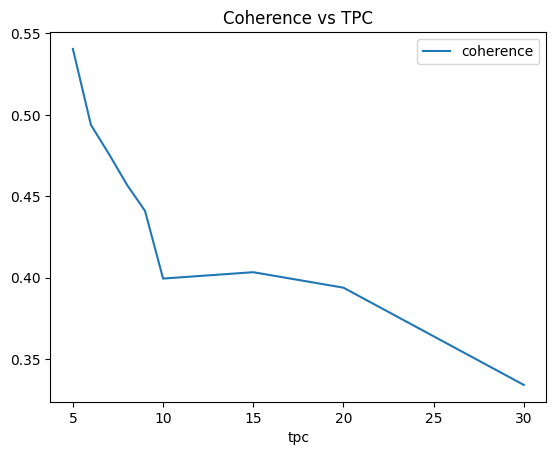

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

all_info_cohrs = []
path_models = "/export/data_ml4ds/NextProcurement/temporal/zaragoza_models/4.training/zaragoza_objectives_extracted_final_with_lemmas"
for model in os.listdir(path_models):
    if "old" not in model:
        coherence_file = f"{path_models}/{model}/TMmodel/topic_coherence.npy"
        tpc = int(model.split("_")[1])
        coherences = np.mean(np.load(coherence_file))
        print(f"Model {tpc} - Coherence: {coherences}")
        all_info_cohrs.append((tpc, coherences))
df_all_info_cohrs = pd.DataFrame(all_info_cohrs, columns=["tpc", "coherence"])
df_all_info_cohrs = df_all_info_cohrs.sort_values("tpc")

df_all_info_cohrs.plot(x="tpc", y="coherence", kind="line", title="Coherence vs TPC")

max_index = df_all_info_cohrs["coherence"].idxmax()
tpc_max_coherence = df_all_info_cohrs.loc[max_index, "tpc"]

print("TPC for max coherence:", tpc_max_coherence)

top_two = df_all_info_cohrs.nlargest(2, "coherence")
tpc_second_max_coherence = top_two.iloc[1]["tpc"]

print("TPC for second max coherence:", tpc_second_max_coherence)


plt.show()


## Obtain ID from PLACE

In [13]:
df_df_gencat

procurement_id_x                                        doc_name  \
0          ntp00114200  ntp00114200_Pliego_Prescripciones_tecnicas_URI   
1          ntp00729859  ntp00729859_Pliego_Prescripciones_tecnicas_URI   
2          ntp01335443  ntp01335443_Pliego_Prescripciones_tecnicas_URI   
3          ntp00196761  ntp00196761_Pliego_Prescripciones_tecnicas_URI   
4          ntp01108524  ntp01108524_Pliego_Prescripciones_tecnicas_URI   
...                ...                                             ...   
40004              NaN  ntp00342450_Pliego_Prescripciones_tecnicas_URI   
40005              NaN  ntp00008722_Pliego_Prescripciones_tecnicas_URI   
40006              NaN  ntp00299675_Pliego_Prescripciones_tecnicas_URI   
40007              NaN  ntp00307454_Pliego_Prescripciones_tecnicas_URI   
40008              NaN  ntp00247190_Pliego_Prescripciones_tecnicas_URI   

      translated  \
0             no   
1             no   
2             no   
3             no   
4             no   
...          ...   
40004        yes   
40005        yes   
40006        yes   
40007        yes   
40008        yes   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [8]:
def obtener_id_place(procurement_id_x):
    url_base = "https://nextprocurement.bsc.es/api/place/"
    url_fallback = "https://nextprocurement.bsc.es/api/place_menores/"
    url_completa = f"{url_base}{procurement_id_x}/id"
    url_completa_fallback = f"{url_fallback}{procurement_id_x}/id"
    
    try:
        print(f"Solicitando ID para {procurement_id_x} con URL principal...")
        response = requests.get(url_completa)
        
        if response.status_code == 200:
            data = response.json()
            print("El json completo es:", data)  
            place_id = data.get('id')
            print("ID obtenido:", place_id)  
            return place_id
        else:
            print("Respuesta no exitosa con la URL principal. Código de estado:", response)
    
    except Exception as e:
        print("Excepción durante la solicitud con la URL principal:", str(e))

    try:
        print(f"Solicitando ID para {procurement_id_x} con URL menores...")
        response = requests.get(url_completa_fallback)
        
        if response.status_code == 200:
            data = response.json()
            print("El json completo es:", data)  
            place_id = data.get('id')
            print("ID obtenido:", place_id)  
            return place_id
        else:
            print("Respuesta no exitosa con la URL menores. Código de estado:", response)
    
    except Exception as e:
        print("Excepción durante la solicitud con la URL secundaria:", str(e))

    print("No se pudo obtener el ID ni con la URL principal ni con la de menores.")
    return None

In [3]:
import pandas as pd
df_df_gencat = pd.read_parquet("/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_31_oct_es_translated_with_place_id_created24feb.parquet")

#
# df_df_gencat['place_id'] = [obtener_id_place(x) for x in tqdm(df_df_gencat['procurement_id_x'])]

In [19]:
df_df_gencat.to_parquet("/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_31_oct_es_translated_with_place_id_created24feb.parquet")

In [20]:
columns_keep_ins_min = [
    #'ContractFolderStatus.ContractFolderID', # Expediente
    'ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode', # CPV
    'ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode', # Country NUTS
    'ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name', # Ubicación orgánica
    'ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount', # Presupuesto
    'ContractFolderStatus.TenderResult.SMEAwardedIndicator', # Es pyme
    'ContractFolderStatus.ContractFolderID', #Expediente
    'title', # PLACE title (objective)
    'ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate', # Date
    'origin',
    'place_id'
]
# outsiders
columns_keep_out = [
    #'ContractFolderStatus.ContractFolderID', # Expediente
    'ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode', #CPV
    'ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode', # Country NUTS
    'ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name', # Ubicación orgánica
    'ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount', # Presupuesto
    'ContractFolderStatus.ContractFolderID', #Expediente
    'title', # PLACE title (objective)
    'ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate', # Date
    'origin',
    'place_id'
]


print("Reading from PLACE starts")
df_PLACE_ins = pd.read_parquet('/export/usuarios_ml4ds/cggamella/sproc/DESCARGA_PLACE_NOV/insiders.parquet')
df_PLACE_out = pd.read_parquet('/export/usuarios_ml4ds/cggamella/sproc/DESCARGA_PLACE_NOV/outsiders.parquet')
df_PLACE_min = pd.read_parquet('/export/usuarios_ml4ds/cggamella/sproc/DESCARGA_PLACE_NOV/minors.parquet')

df_PLACE_out['origin'] = 'out'
df_PLACE_ins['origin'] = 'ins'
df_PLACE_min['origin'] = 'min'

def unify_colname(col):
    return ".".join([el for el in col if el])

df_PLACE_ins = df_PLACE_ins.rename(columns={"id":"place_id"})
df_PLACE_min = df_PLACE_min.rename(columns={"id":"place_id"})
df_PLACE_out = df_PLACE_out.rename(columns={"id":"place_id"})

df_PLACE_out.columns = [unify_colname(col) for col in df_PLACE_out.columns]
df_PLACE_ins.columns = [unify_colname(col) for col in df_PLACE_ins.columns]
df_PLACE_min.columns = [unify_colname(col) for col in df_PLACE_min.columns]

df_PLACE_out = df_PLACE_out[columns_keep_out]
df_PLACE_out = df_PLACE_out.loc[:, ~df_PLACE_out.columns.duplicated()]

df_PLACE_ins = df_PLACE_ins[columns_keep_ins_min]
df_PLACE_ins = df_PLACE_ins.loc[:, ~df_PLACE_ins.columns.duplicated()]

df_PLACE_min = df_PLACE_min[columns_keep_ins_min]
df_PLACE_min = df_PLACE_min.loc[:, ~df_PLACE_min.columns.duplicated()]

df_PLACE_all = pd.concat([df_PLACE_min, df_PLACE_ins, df_PLACE_out], ignore_index=True)

print("PLACE created")

df_df_gencat = pd.merge(df_df_gencat, df_PLACE_all, on="place_id", how="left")

Reading from PLACE starts
PLACE created


In [ ]:
df_df_gencat.to_parquet("/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_31_oct_es_translated_with_place_id_created24feb_merge_with_place.parquet")

In [23]:
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

model = SentenceTransformer("paraphrase-multilingual-MiniLM-L12-v2")

def compute_similarity(row, col1, col2):
    text1, text2 = row[col1], row[col2]
    
    if pd.notna(text1) and pd.notna(text2):  # Ensure both are not None
        emb1 = model.encode([text1])[0]
        emb2 = model.encode([text2])[0]
        similarity = cosine_similarity([emb1], [emb2])[0][0]
        return similarity
    return np.nan  # If any value is None, return NaN

def add_similarity_column(df, col1, col2, new_col="similarity"):
    df[new_col] = df.apply(lambda row: compute_similarity(row, col1, col2), axis=1)
    return df

/export/usuarios_ml4ds/lbartolome/NextProcurement/NP-Text_Object/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/export/usuarios_ml4ds/lbartolome/NextProcurement/NP-Text_Object/.venv/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [1]:
#df_df_gencat = add_similarity_column(df_df_gencat, "objective", "title")
import pandas as pd
df_df_gencat = pd.read_parquet("/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_31_oct_es_translated_with_place_id_created24feb_merge_with_place.parquet")

In [4]:
# remove unncesary columns
df_df_gencat.columns

df_df_gencat = df_df_gencat[['procurement_id', 'place_id', 'objective', 'title']]

df_df_gencat

,procurement_id,place_id,objective,title
0,ntp00114200,https://contrataciondelestado.es/sindicacion/P...,El objeto del presente Pliego es la definición...,Suministro de Detector de Equipo de RX Portáti...
1,ntp00729859,https://contrataciondelestado.es/sindicacion/l...,"El objeto del contrato, correspondiente a la p...",Prestación de Servicios de Explotación de los ...
2,ntp01335443,https://contrataciondelestado.es/sindicacion/l...,El objeto de estos pliegos es la definición de...,Servicio de gestión de las oficinas municipale...
3,ntp00196761,https://contrataciondelestado.es/sindicacion/P...,El presente Pliego de Prescripciones tiene por...,Servicios por lotes para la conservación de vi...
4,ntp01108524,https://contrataciondelestado.es/sindicacion/l...,Contratación del servicio de profesional de re...,Representación judicial y defensa jurídica en ...
...,...,...,...,...
437204,ntp00342450,https://contrataciondelestado.es/sindicacion/P...,El objeto de la licitación es el suministro di...,Subministrament d'aliments per als animals del...
437205,ntp00008722,https://contrataciondelestado.es/sindicacion/P...,Elaborar para cada una de las instalaciones un...,L'objecte del contracte és la prestació del se...
437206,ntp00299675,https://contrataciondelestado.es/sindicacion/P...,El objeto del contrato es la limpieza de las i...,"Servei de neteja de l'Institut Cavall Bernat, ..."
437207,ntp00307454,https://contrataciondelestado.es/sindicacion/P...,"El objeto del contrato, en forma de lotes sepa...",La que es descriu al Plec de Prescripcions Tèc...


In [6]:
# divide the dataframe into three parts
import numpy as np
parts = np.array_split(df_df_gencat, 3)
for id_part, part in enumerate(parts):
    print(part.shape)
    # save the part
    part.to_parquet(f"/export/data_ml4ds/NextProcurement/PLACE/pliegos_objectives/all_extracted_31_oct_es_translated_with_place_id_created24feb_merge_with_place_part_{id_part}.parquet")

/export/usuarios_ml4ds/lbartolome/NextProcurement/NP-Text_Object/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


(145737, 4)
(145736, 4)
(145736, 4)


In [ ]:
df_df_gencat

,doc_name,translated,extracted,clean_extracted,lang,objective,in_text_score,processed_0,processed_1000,processed_2000,...,ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode,ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode,ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name,ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount,ContractFolderStatus.TenderResult.SMEAwardedIndicator,ContractFolderStatus.ContractFolderID,title,ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate,origin,similarity
0,ntp00114200_Pliego_Prescripciones_tecnicas_URI,no,g PLIEGO DE PRESCRI PCI ONES TÉCNI CAS\n S\n \...,g PLIEGO DE PRESCRI PCI ONES TÉCNI CAS S - CON...,spa_Latn,El objeto del presente Pliego es la definición...,1.000000,True,True,True,...,[33111000.0],ES120,<NA>,28000.00,None,NS221/18,Suministro de Detector de Equipo de RX Portáti...,"[['2018-02-06', '2018-02-06'], ['2018-03-05', ...",out,0.641474
1,ntp00729859_Pliego_Prescripciones_tecnicas_URI,no,PLIEGO DE PRESCRIPCIONES TÉCNICAS QUE HA DE RE...,PLIEGO DE PRESCRIPCIONES TÉCNICAS QUE HA DE RE...,spa_Latn,"El objeto del contrato, correspondiente a la p...",1.000000,True,True,True,...,[50330000.0],ES,Mutua Midat Cyclops,498030.00,[nan],N202000910,Prestación de Servicios de Explotación de los ...,"[['2020-12-21', '2020-12-16', '2020-12-28'], [...",ins,0.247979
2,ntp01335443_Pliego_Prescripciones_tecnicas_URI,no,PLIEGO DE PRESCRIPCIONES TÉCNICAS PARA LA CONT...,PLIEGO DE PRESCRIPCIONES TÉCNICAS PARA LA CONT...,spa_Latn,El objeto de estos pliegos es la definición de...,1.000000,True,True,True,...,[63513000.0],ES532,Bellver S.A.,395101.62,[false],2023/722,Servicio de gestión de las oficinas municipale...,"[['2023-04-05', '2023-08-04', '2023-07-07', '2...",ins,0.657591
3,ntp00196761_Pliego_Prescripciones_tecnicas_URI,no,Ref: 50/088288.9/21\nAgencia de Vivienda Socia...,Ref: 50/088288.9/21 Agencia de Vivienda Social...,spa_Latn,El presente Pliego de Prescripciones tiene por...,1.000000,True,True,True,...,"[[90920000, 90470000, 90500000, 90911000, 6010...",ES300,"Consejería de Medio Ambiente, Vivienda y Agric...",283007.53,None,A-SER-017013/2021,Servicios por lotes para la conservación de vi...,[2021-07-02],out,0.567718
4,ntp01108524_Pliego_Prescripciones_tecnicas_URI,no,PLIEGO DE PRESCRIPCIONES TÉCNICAS QUE HA DE RE...,PLIEGO DE PRESCRIPCIONES TÉCNICAS QUE HA DE RE...,spa_Latn,Contratación del servicio de profesional de re...,1.000000,True,True,True,...,[79112000.0],ES422,Mugenat,34144.00,[true],027-2023-0007,Representación judicial y defensa jurídica en ...,"[['2023-07-12'], ['2023-02-27', '2023-02-27'],...",ins,0.870487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
437204,ntp00342450_Pliego_Prescripciones_tecnicas_URI,yes,PLIEGO DE CLÁUSULAS TÉCNICAS CONTRATACIÓN DE S...,None,None,El objeto de la licitación es el suministro di...,1.000000,True,True,True,...,[15713000.0],ES511,Entitats de l'administració local,259958.38,None,1431-1071/2021,Subministrament d'aliments per als animals del...,"[['2022-09-30'], ['2023-02-23', '2023-02-23'],...",out,0.756885
437205,ntp00008722_Pliego_Prescripciones_tecnicas_URI,yes,d PLIEGO DE CLAUSULAS '[ECNICAS PARA LA CONTRA...,None,None,Elaborar para cada una de las instalaciones un...,1.000000,True,True,True,...,[90920000.0],ES51,Entitats municipals de Catalunya,34000.00,None,1/2018,L'objecte del contracte és la prestació del se...,[2018-03-08],out,0.303629
437206,ntp00299675_Pliego_Prescripciones_tecnicas_URI,yes,Generalidad de Cataluña Departamento de Educac...,None,None,El objeto del contrato es la limpieza de las i...,0.956522,True,True,True,...,[90919300.0],ES511,Departaments i Sector Públic de la Generalitat,101318.20,None,08053251/2022/02,"Servei de neteja de l'Institut Cavall Bernat, ...","[['2022-05-25', '2022-07-08', '2022-0

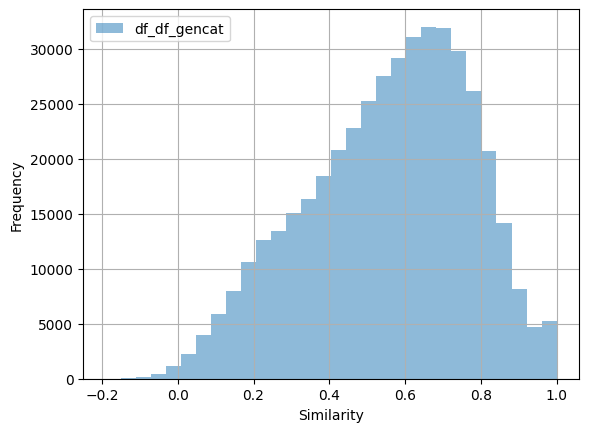

In [2]:
import matplotlib.pyplot as plt

df_df_gencat.similarity.hist(alpha=0.5, label="df_df_gencat", bins=30)


plt.legend()
plt.xlabel("Similarity")
plt.ylabel("Frequency")
plt.show()


In [3]:
df_df_gencat[(df_df_gencat.similarity < 0.6) & (df_df_gencat.similarity > 0.5)][["objective", "title", "similarity", "in_text_score"]].iloc[0]

objective        El presente Pliego de Prescripciones tiene por...
title            Servicios por lotes para la conservación de vi...
similarity                                                0.567718
in_text_score                                                  1.0
Name: 3, dtype: object

In [4]:
df_df_gencat[df_df_gencat.similarity >0.4][["objective", "title", "similarity", "in_text_score"]]

,objective,title,similarity,in_text_score
0,El objeto del presente Pliego es la definición...,Suministro de Detector de Equipo de RX Portáti...,0.641474,1.000000
2,El objeto de estos pliegos es la definición de...,Servicio de gestión de las oficinas municipale...,0.657591,1.000000
3,El presente Pliego de Prescripciones tiene por...,Servicios por lotes para la conservación de vi...,0.567718,1.000000
4,Contratación del servicio de profesional de re...,Representación judicial y defensa jurídica en ...,0.870487,1.000000
5,El Centro Sanitario deberá contar con personal...,servicio de asistencia sanitaria hospitalaria ...,0.465000,1.000000
...,...,...,...,...
437201,El objeto del presente pliego es la contrataci...,Servei d’actualització digital i escalabilitat...,0.657496,1.000000
437202,El objeto de este contrato es la gestión de la...,L’objecte del contracte és la concessió de ser...,0.647649,1.000000
437203,El objeto del presente pliego de prescripcione...,Subministrament de xeringues per a tots els ce...,0.698358,1.000000
437204,El objeto de la licitación es el suministro di...,Subministrament d'aliments per als animals del...,0.756885,1.000000


In [5]:
import sys
sys.path.append("../")
from src.objective_tender_extraction.prompter import Prompter

In [69]:
prompter =  Prompter(model_type="qwen2.5:72b-instruct")

INSTRUCTIONS_PATH = "/export/usuarios_ml4ds/lbartolome/NextProcurement/NP-Text_Object/src/objective_tender_extraction/templates/decision_objective.txt"
with open(INSTRUCTIONS_PATH, 'r') as file: template = file.read()

In [70]:
def get_decision(row):
    try:
        formatted_template = template.format(document_a=row.objective, document_b= row.title)
        decision = prompter.prompt(formatted_template)[0]
    except Exception as e:
        decision = "unknown"
    if decision == "A":
        return "objective"
    elif decision == "B":
        return "title"
    else:
        return "neither"

In [65]:
len(df_df_gencat)

437209

In [105]:
df_df_gencat_sample = df_df_gencat.sample(100, random_state=45)

df_df_gencat_sample["decision"] = df_df_gencat_sample.apply(get_decision, axis=1)

df_df_gencat_sample[(df_df_gencat_sample.decision == "neither") &(df_df_gencat_sample.similarity > 0.6)][["title", "objective", "decision","similarity", "in_text_score"]]#.head(25).to_excel("prueba_judge.xlsx")

,title,objective,decision,similarity,in_text_score
34205,Suministro de alquiler de una caseta para el m...,Suministro de alquiler de una caseta para el m...,neither,1.000000,1.00000
392290,Contratación del transporte escolar en las loc...,Contratación del transporte escolar en las loc...,neither,1.000000,1.00000
276249,Suministro de un analizador de gases residuale...,Suministro de un analizador de gases residuale...,neither,0.912894,1.00000
9824,"Suministro de terminales móviles libres, auric...",El objeto del contrato será el suministro de l...,neither,0.790603,0.96875


In [107]:
df_df_gencat_sample[["title", "objective", "decision", "similarity", "in_text_score"]]

,title,objective,decision,similarity,in_text_score
214380,Trabajos de sustitución de producción de frio ...,El objeto de este documento es establecer las ...,objective,0.734767,1.000000
127821,"Operación Tesorería 900.000,00€",El objeto de este contrato es la contratación ...,objective,0.356913,1.000000
15190,Contrato mixto de suministro en régimen de arr...,El objeto del presente contrato es el suminist...,title,0.784520,0.972222
114136,Suministro de licencias de cliente para el acc...,El objeto de presente contrato consiste en la ...,objective,0.673157,0.976744
10470,Servicios para la administración de las redes ...,El objeto del presente contrato es: La provisi...,objective,0.775431,1.000000
...,...,...,...,...,...
9824,"Suministro de terminales móviles libres, auric...",El objeto del contrato será el suministro de l...,neither,0.790603,0.968750
317287,Tubería de Cuni 70/30 del S82,Establecer los requisitos técnicos exigibles p...,objective,0.608599,1.000000
154396,Redacción del Plan de Seguridad de los Mercadi...,El objeto de la presente licitación es la cont...,objective,0.589503,1.000000
417060,Servicio de control de plagas urbanas en el té...,Constituye el objeto del presente contrato la ...,objective,0.460189,0.979167


In [115]:
df_df_gencat.columns

Index(['doc_name', 'translated', 'extracted', 'clean_extracted', 'lang',
       'objective', 'in_text_score', 'processed_0', 'processed_1000',
       'processed_2000', 'processed_3000', 'processed_4000', 'procurement_id',
       'alternative_lang', 'lang_objective', 'place_id',
       'ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode',
       'ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode',
       'ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name',
       'ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount',
       'ContractFolderStatus.TenderResult.SMEAwardedIndicator',
       'ContractFolderStatus.ContractFolderID', 'title',
       'ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate',
       'origin', 'similarity'],
      dtype='object')

In [120]:
df_df_gencat.columns

Index(['doc_name', 'translated', 'extracted', 'clean_extracted', 'lang',
       'objective', 'in_text_score', 'processed_0', 'processed_1000',
       'processed_2000', 'processed_3000', 'processed_4000', 'procurement_id',
       'alternative_lang', 'lang_objective', 'place_id',
       'ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode',
       'ContractFolderStatus.ProcurementProject.RealizedLocation.CountrySubentityCode',
       'ContractFolderStatus.LocatedContractingParty.ParentLocatedParty.PartyName.Name',
       'ContractFolderStatus.ProcurementProject.BudgetAmount.EstimatedOverallContractAmount',
       'ContractFolderStatus.TenderResult.SMEAwardedIndicator',
       'ContractFolderStatus.ContractFolderID', 'title',
       'ContractFolderStatus.ValidNoticeInfo.AdditionalPublicationStatus.AdditionalPublicationDocumentReference.IssueDate',
       'origin', 'similarity'],
      dtype='object')

In [ ]:
# sample 30 rows for each similarity value (in 0.1 increments)

iter_seed = 0
for admin in ["zaragoza", "madrid", "gencat"]:
    seed = 45 + iter_seed
    all = []
    for i in range(0, 11):
        good_ones = df_df_gencat[(df_df_gencat.objective != "/") & (df_df_gencat.lang_objective == "es")].copy()
        print(len(good_ones))
        df_df_gencat_sample = good_ones[good_ones.similarity.between(i/10, (i+1)/10)].sample(20, random_state=seed)
        keep = df_df_gencat_sample[["place_id", "procurement_id", "link","objective", "ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode", "similarity"]]
        keep = keep.rename(columns={"ContractFolderStatus.ProcurementProject.RequiredCommodityClassification.ItemClassificationCode": "cpv", "procurement_id": "bsc_id"})
        all.append(
            keep
        )
    df_analysis = pd.concat(all)
    df_analysis["label"] = [""] * len(df_analysis)
    # random sample so they are not ordered by similarity
    df_analysis = df_analysis.sample(frac=1, random_state=45)
    df_analysis.to_excel(f"../data/admin_eval_task/{admin}_objectives_to_review.xlsx")
    iter_seed += 1

In [ ]:
df_place_full = pd.read_parquet("/export/usuarios_ml4ds/lbartolome/NextProcurement/sproc/place_feb_21/preprocessed/place_all.parquet")

# enrich df_df_gencat with link from PLACE keeping all the columns from df_df_gencat and adding only the link from df_place_full
df_df_gencat = pd.merge(df_df_gencat, df_place_full[["place_id", "link"]], on="place_id", how="left")
